# Document Alignment
### Complete # TODO

In [47]:
# Imports
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

## Step 1: Read Tempalate and Scanned Image

In [48]:
# Define the path to the reference image file using os.path.join for cross-platform compatibility
refFilename = os.path.join("images", "form.jpg")

# Read the reference image in color mode
im1 = cv2.imread(refFilename)

# Convert the reference image from BGR to RGB format
im1 = cv2.cvtColor(im1, cv2.COLOR_BGR2RGB)

# Define the path to the image to be aligned using os.path.join for cross-platform compatibility
imFilename = os.path.join("images", "scanned_form.jpg")

# Read the image to be aligned in color mode
im2 = cv2.imread(imFilename)

# Convert the image to be aligned from BGR to RGB format
im2 = cv2.cvtColor(im2, cv2.COLOR_BGR2RGB)


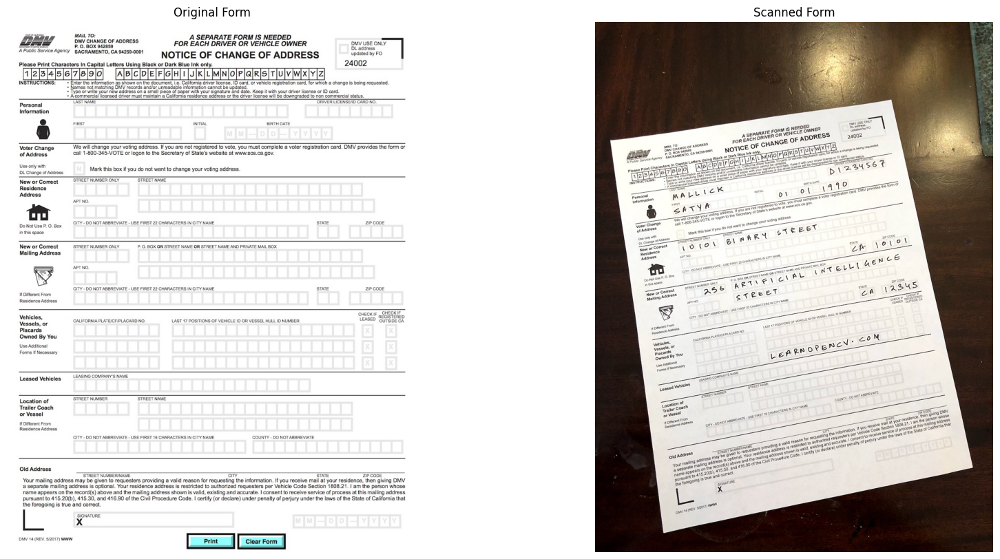

In [49]:
# Display Images
plt.figure(figsize=[20, 10])
plt.subplot(121)
plt.axis("off")
plt.imshow(im1)
plt.title("Original Form")

plt.subplot(122)
plt.axis("off")
plt.imshow(im2)
plt.title("Scanned Form")
plt.show()

## Step 2: Find keypoints in both Images

Think of keypoints as corner points that are stable under image transformations

<div dir=rtl>

# **یافتن نقاط کلیدی در تصاویر**
</div>

<div dir=rtl>

**:هدف این بخش**
</div>

<div dir=rtl>

هدف اصلی این گام، شناسایی و استخراج "نقاط کلیدی" (Keypoints) و "توصیف‌گرهای" (Descriptors) مرتبط با آن‌ها از هر دو تصویر (تصویر مرجع و تصویر اسکن شده) است. این نقاط و توصیف‌گرها، ویژگی‌های متمایز و پایداری از تصاویر را ارائه می‌دهند که برای تراز کردن دقیق آن‌ها در مراحل بعدی ضروری هستند.
</div>
<div dir=rtl>

**فرایند گام به گام:**
</div>

<div dir=rtl>

* **تبدیل به خاکستری**: ابتدا هر دو تصویر رنگی به فرمت خاکستری تبدیل شدند. این کار برای ساده‌سازی پردازش و افزایش کارایی الگوریتم تشخیص ویژگی صورت می‌گیرد، زیرا اطلاعات رنگی معمولاً برای شناسایی نقاط ساختاری تصویر اهمیتی ندارند.
* **آشکارساز ویژگی ORB:** یک شیء از آشکارساز ویژگی ORB (Oriented FAST and Rotated BRIEF) ایجاد شد. ORB یک الگوریتم سریع و مقیاس‌ناور (Scale-Invariant) و دوران‌ناور (Rotation-Invariant) است که قادر به یافتن نقاط مشخص و منحصر به فرد در تصاویر است. حداکثر تعداد ۵۰۰ ویژگی برای تشخیص تعیین شد.
* **تشخیص و محاسبه توصیف‌گرها:** با استفاده از متد detectAndCompute در ORB، نقاط کلیدی در هر دو تصویر خاکستری شناسایی و توصیف‌گرهای متناظر با آن‌ها محاسبه شدند. توصیف‌گرها در واقع بردارهای عددی هستند که پچ (Patch) اطراف هر نقطه کلیدی را توصیف می‌کنند و امکان مقایسه و تطبیق آن‌ها را فراهم می‌آورند.
* **نمایش بصری:** نقاط کلیدی شناسایی شده روی نسخه‌های رنگی اصلی تصاویر کشیده شده و به صورت بصری نمایش داده شدند. این نمایش به کاربر اجازه می‌دهد تا از صحت و توزیع مناسب نقاط کلیدی اطمینان حاصل کند. برای نمایش در محیط Colab، تصاویر کنار هم قرار داده شدند.
</div>
<div dir=rtl>

**اهمیت این بخش:**
این گام زیربنای مراحل بعدی تراز کردن تصاویر است. کیفیت و دقت نقاط کلیدی و توصیف‌گرهای آن‌ها مستقیماً بر موفقیت "تطبیق ویژگی‌ها" (Feature Matching) و در نهایت بر دقت "تخمین تبدیل هندسی" (Homography Estimation) که تصویر اسکن شده را با تصویر مرجع تراز می‌کند، تأثیر می‌گذارد.
</div>


In [50]:
# Convert images to grayscale
im1_gray = cv2.cvtColor(im1, cv2.COLOR_BGR2GRAY)
im2_gray = cv2.cvtColor(im2, cv2.COLOR_BGR2GRAY)


# Detect ORB features using OpenCV and compute descriptors.
MAX_NUM_FEATURES = 500
orb = cv2.ORB_create(nfeatures=MAX_NUM_FEATURES)
keypoints1, descriptors1 = orb.detectAndCompute(im1_gray, None)
keypoints2, descriptors2 = orb.detectAndCompute(im2_gray, None)


Images have different heights for display. Resizing to match.
Displaying images with detected keypoints (Reference | Scanned):


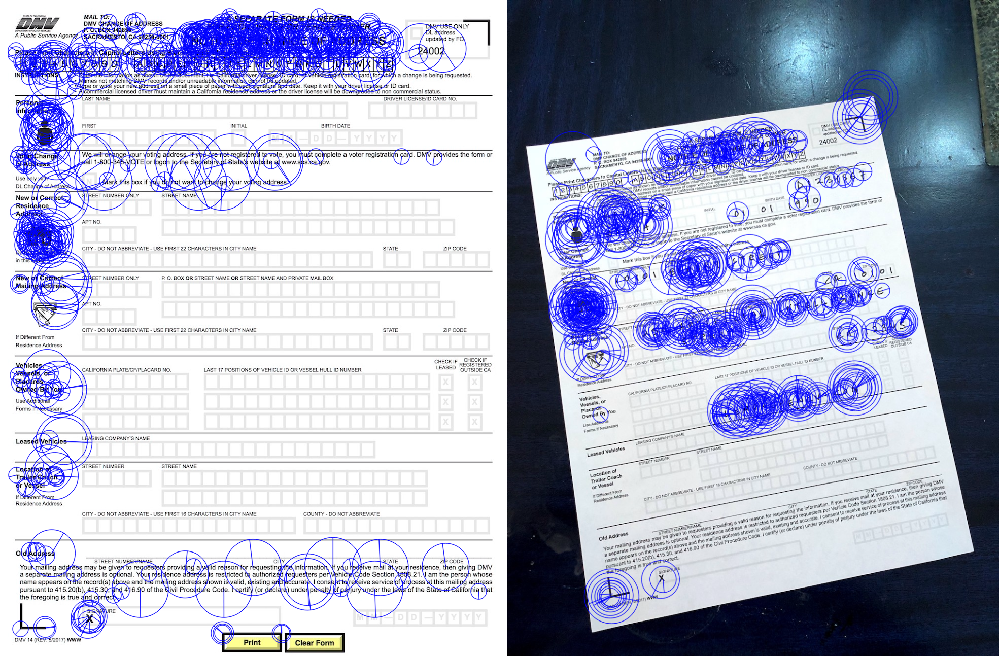

In [56]:
# Display
im1_display = cv2.drawKeypoints(
    im1,
    keypoints1,
    outImage=np.array([]),
    color=(255, 0, 0),
    flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS,
)

im2_display = cv2.drawKeypoints(
    im2,
    keypoints2,
    outImage=np.array([]),
    color=(255, 0, 0),
    flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS,
)

# Plot
if im1_display.shape[0] != im2_display.shape[0]:
    print("Images have different heights for display. Resizing to match.")
    # Decide which image to resize. Here, we'll resize im2_display to match im1_display's height.
    # Maintain aspect ratio for im2_display
    new_height = im1_display.shape[0]
    new_width_im2 = int(im2_display.shape[1] * (new_height / im2_display.shape[0]))
    im2_display_resized = cv2.resize(im2_display, (new_width_im2, new_height))
    combined_display = np.concatenate((im1_display, im2_display_resized), axis=1)
else:
    combined_display = np.concatenate((im1_display, im2_display), axis=1)


print("Displaying images with detected keypoints (Reference | Scanned):")
cv2_imshow(combined_display)

## Step 3 : Match keypoints in the two image


<div dir=rtl>

# **تطبیق ویژگی‌ها**
</div>

<div dir=rtl>

**:هدف این بخش**
</div>

<div dir=rtl>

هدف این مرحله، شناسایی جفت‌های متناظر از نقاط کلیدی بین دو تصویر (مرجع و اسکن شده) است که در گام قبلی استخراج شدند. این کار با مقایسه "توصیف‌گرهای" (Descriptors) آن‌ها انجام می‌شود.
</div>
<div dir=rtl>

**فرایند گام به گام:**
</div>

<div dir=rtl>

* **ایجاد تطبیق‌دهنده (Matcher):** یک شیء cv2.BFMatcher (Brute-Force Matcher) با الگوریتم cv2.NORM_HAMMING ایجاد شد. این نوع تطبیق‌دهنده برای مقایسه توصیف‌گرهای باینری (مانند ORB) با محاسبه "فاصله همینگ" (Hamming Distance) مناسب است و به سادگی هر توصیف‌گر از یک تصویر را با تمام توصیف‌گرهای تصویر دیگر مقایسه می‌کند.
* **تطبیق اولیه:** تابع matcher.match() برای یافتن تمام تطابق‌های ممکن بین توصیف‌گرهای دو تصویر استفاده شد.
* **فیلتر کردن تطابق‌ها:**

    * **مرتب‌سازی:**تطابق‌های یافت شده بر اساس "فاصله" (Distance) به صورت صعودی مرتب شدند. فاصله کمتر نشان‌دهنده شباهت بیشتر و تطابق قوی‌تر بین توصیف‌گرهاست.
    * **انتخاب بهترین‌ها:** تنها ۱۰٪ از بهترین تطابق‌ها (آن‌هایی که کمترین فاصله را داشتند) انتخاب و برای مراحل بعدی نگهداری شدند. این کار به حذف تطابق‌های ضعیف یا نادرست کمک می‌کند
* **نمایش تطابق‌ها:** تابع cv2.drawMatches() برای رسم خطوط بین نقاط کلیدی متناظر در دو تصویر (قرار گرفته در کنار هم) استفاده شد. این خروجی بصری به ما امکان می‌دهد کیفیت و توزیع تطابق‌های یافت شده را ارزیابی کنیم.
* **نمایش با Matplotlib:** تصویر نهایی im_matches حاوی خطوط تطبیق، با استفاده از matplotlib.pyplot نمایش داده شد تا دید بهتری از فرایند تطبیق فراهم شود.

</div>
<div dir=rtl>

**اهمیت این بخش:**

این گام حیاتی است زیرا تطابق‌های صحیح و دقیق بین ویژگی‌های دو تصویر، داده‌های ورودی لازم را برای گام بعدی یعنی "تخمین هوموگرافی" (Homography Estimation) فراهم می‌کنند. هوموگرافی، تبدیل هندسی مورد نیاز برای تراز کردن واقعی دو تصویر را محاسبه می‌کند.
</div>


In [57]:
# Create a DescriptorMatcher object with the BRUTEFORCE_HAMMING algorithm.
# This matcher is used to compare feature descriptors and find the best matches.
matcher = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=False)

# Match the feature descriptors from two images.
# The match() function finds the best matches between descriptors1 and descriptors2.
# The resulting matches are stored in a list.
matches = list(matcher.match(descriptors1, descriptors2, None))

# Sort the matches based on their distance.
# The distance represents how similar the matched descriptors are.
# Sorting in ascending order (reverse=False) means the best matches (lowest distance) come first.
matches.sort(key=lambda x: x.distance, reverse=False)

# Determine the number of good matches to keep.
# Here, we keep the top 10% of matches.
numGoodMatches = int(len(matches) * 0.1)

# Slice the sorted matches to keep only the top 'numGoodMatches'.
matches = matches[:numGoodMatches]


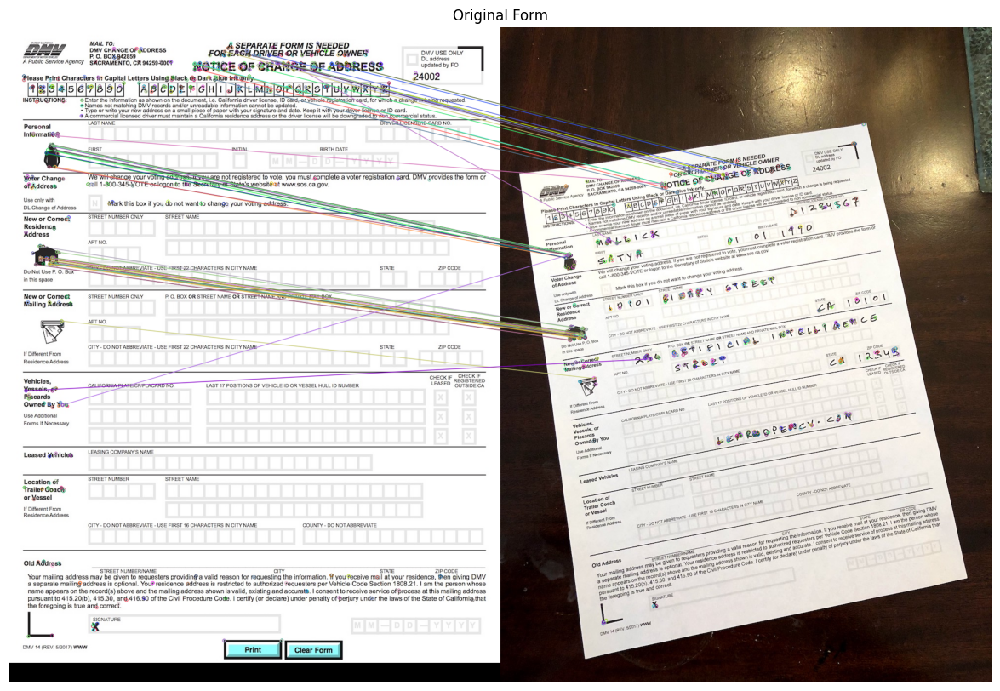

In [58]:
# Draw top matches
im_matches = cv2.drawMatches(im1, keypoints1, im2, keypoints2, matches, None)

# Display im_matches
plt.figure(figsize=[40, 10])
plt.imshow(im_matches)
plt.axis("off")
plt.title("Original Form")
plt.show()

<div dir=rtl>

# محاسبه هوموگرافی و تراز کردن تصاویر
</div>

<div dir=rtl>

**هدف این بخش:**
</div>

<div dir=rtl>

هدف نهایی این گام، محاسبه تبدیل هندسی لازم (هوموگرافی) برای هم‌راستا کردن دقیق تصویر اسکن شده با تصویر مرجع، و سپس اعمال این تبدیل برای تولید تصویر نهایی تراز شده است.

</div>
<div dir=rtl>

فرایند گام به گام:

</div>

<div dir=rtl>

* **استخراج نقاط تطبیق یافته:** ابتدا، مختصات دقیق نقاط کلیدی که در مرحله قبل با موفقیت تطبیق داده شده بودند، از لیست matches استخراج و در دو آرایه (points1 و points2) ذخیره شدند. points1 شامل مختصات نقاط در تصویر مرجع و points2 شامل مختصات متناظر در تصویر اسکن شده است.
* **محاسبه هوموگرافی:** تابع cv2.findHomography() با استفاده از points1 و points2 فراخوانی شد. این تابع یک ماتریس تبدیل 3times3 به نام "هوموگرافی" (h) را محاسبه می‌کند. الگوریتم RANSAC نیز در این مرحله به کار گرفته می‌شود تا تخمین هوموگرافی در برابر تطابق‌های نادرست (outliers) مقاوم باشد و نتیجه دقیق‌تری به دست آید.
* **اعمال تبدیل (Warping):** پس از محاسبه ماتریس هوموگرافی (h)، تابع cv2.warpPerspective() روی تصویر اسکن شده (im2) اعمال شد. این تابع، تصویر im2 را بر اساس ماتریس h و ابعاد تصویر مرجع (im1) تغییر شکل می‌دهد تا به صورت هندسی با im1 تراز شود. نتیجه، تصویر im2_reg (تصویر اسکن شده تراز شده) است.
* **نمایش نتایج**

</div>
<div dir=rtl>

**اهمیت این بخش:**

این گام، اوج فرایند تراز کردن تصاویر است. با محاسبه هوموگرافی و اعمال آن، تصویر اسکن شده به گونه‌ای تغییر شکل می‌دهد که از نظر فضایی با تصویر مرجع منطبق شود. این تراز شدن برای کاربردهای متعددی مانند مقایسه تصاویر، تشخیص تغییرات، یا ترکیب اطلاعات از منابع مختلف تصویر، ضروری است.

</div>


## Step 4:  Find Homography



In [54]:
# Extract location of good matches
points1 = np.zeros((len(matches), 2), dtype=np.float32)
points2 = np.zeros((len(matches), 2), dtype=np.float32)

for i, match in enumerate(matches):
    points1[i, :] = keypoints1[match.queryIdx].pt
    points2[i, :] = keypoints2[match.trainIdx].pt

# Find homography
h, mask = cv2.findHomography(points2, points1, cv2.RANSAC)

## Step 5: Warp image

Displaying Reference Image (left) and Aligned Image (right):


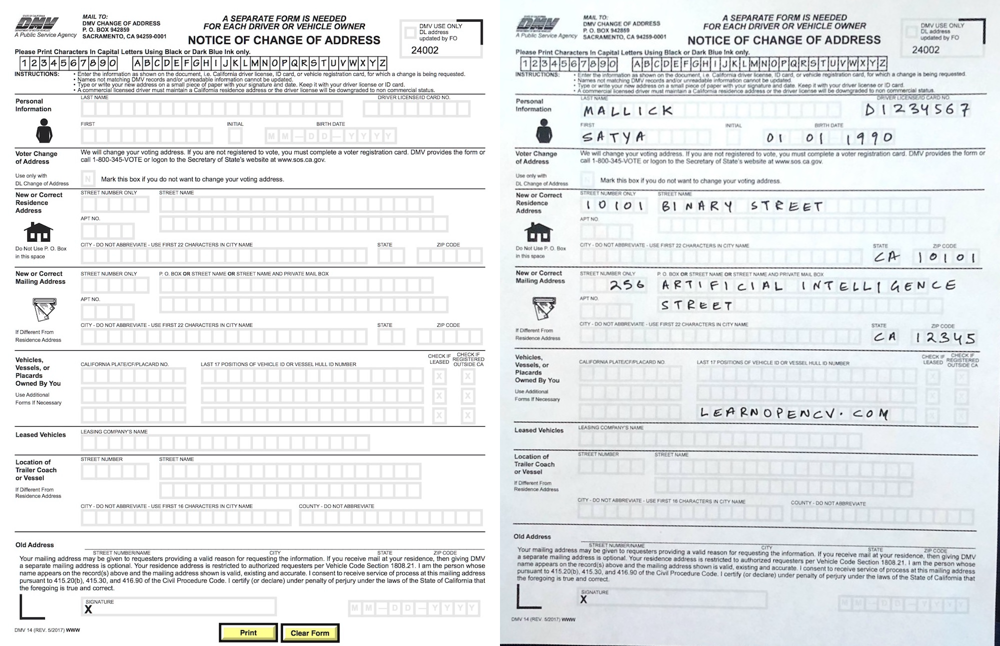

In [59]:
# Use homography to warp image
height, width, channels = im1.shape
im2_reg = cv2.warpPerspective(im2, h, (width, height))

# Display results
plt.figure(figsize=[20, 10])
plt.subplot(121)
plt.imshow(im1)
plt.axis("off")
plt.title("Original Form")
plt.subplot(122)
plt.imshow(im2_reg)
plt.axis("off")
plt.title("Scanned Form")
plt.show()

<div dir=rtl>

**نکته مهم:**
من سعی کردم خودم یک فرم پرینت کنم و فایل اصلی را دانلود کنم و نتایج را با عکس های خودم نمایش دهم،ولی به علت اختلاف زیاد کیفیت دو تصویر، پس از یافتن نقاط کلیدی، نقاط نامرتبطی از دو تصویر به هم assign می شدند، به همین جهت، نتایج را روی عکس هایی که در لینک گیت هاب پروژه وجود داشت ارزیابی کردم.(عکس هایی که خودم تهیه کردم با نام های form2.jpg و scanned_form2.jpg در پوشه images از این بخش قرار دارند.)
</div>